### Importación de datos



In [31]:
import pandas as pd
import matplotlib.pyplot as plt 
import folium

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tiendas = [tienda, tienda2, tienda3, tienda4]
tiendas_labels = ["Tienda 1", "Tienda 2", "Tienda 3", "Tienda 4"]

tienda.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359


# 1. Análisis de facturación



In [2]:
ingresos = []

for t in tiendas:
    ingresos.append(t['Precio'].sum() / 1000000)

for i in ingresos:  
    print(i)

1150.8804
1116.3435
1098.0196
1038.3757


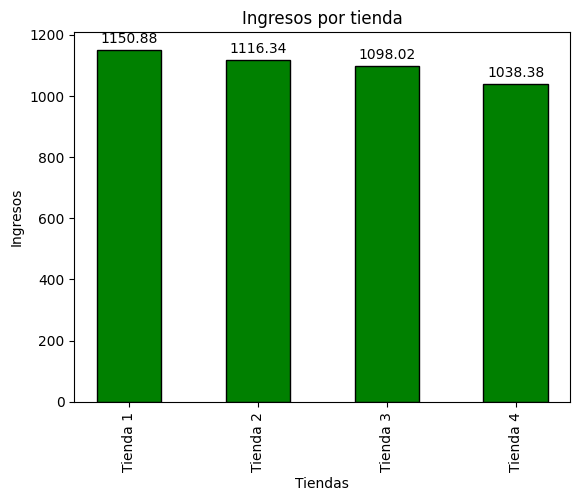

In [3]:
bar = plt.bar(tiendas_labels, ingresos, color="green", width=0.5, align="center", edgecolor="black")
plt.xticks(rotation=90)
plt.bar_label(bar, padding=3)
plt.xlabel("Tiendas")
plt.ylabel("Ingresos")
plt.title("Ingresos por tienda")
plt.show()

# 2. Ventas por categoría

In [4]:
ventas_categorias = []

for t in tiendas:
  ventas_categorias.append(t.groupby(['Categoría del Producto']).size())

for i in range(len(tiendas)):
  print("\n Cantidad de ventas de la tienda", i+1, "por categoria \n")
  print(ventas_categorias[i])


 Cantidad de ventas de la tienda 1 por categoria 

Categoría del Producto
Artículos para el hogar    171
Deportes y diversión       284
Electrodomésticos          312
Electrónicos               448
Instrumentos musicales     182
Juguetes                   324
Libros                     173
Muebles                    465
dtype: int64

 Cantidad de ventas de la tienda 2 por categoria 

Categoría del Producto
Artículos para el hogar    181
Deportes y diversión       275
Electrodomésticos          305
Electrónicos               422
Instrumentos musicales     224
Juguetes                   313
Libros                     197
Muebles                    442
dtype: int64

 Cantidad de ventas de la tienda 3 por categoria 

Categoría del Producto
Artículos para el hogar    177
Deportes y diversión       277
Electrodomésticos          278
Electrónicos               451
Instrumentos musicales     177
Juguetes                   315
Libros                     185
Muebles                    499
dtype

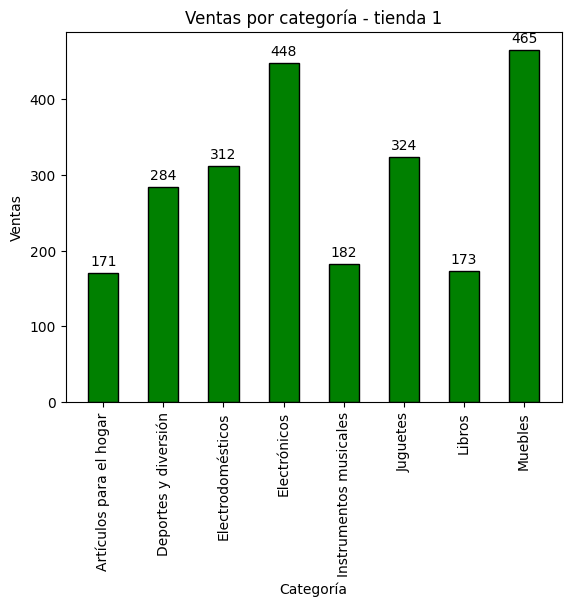

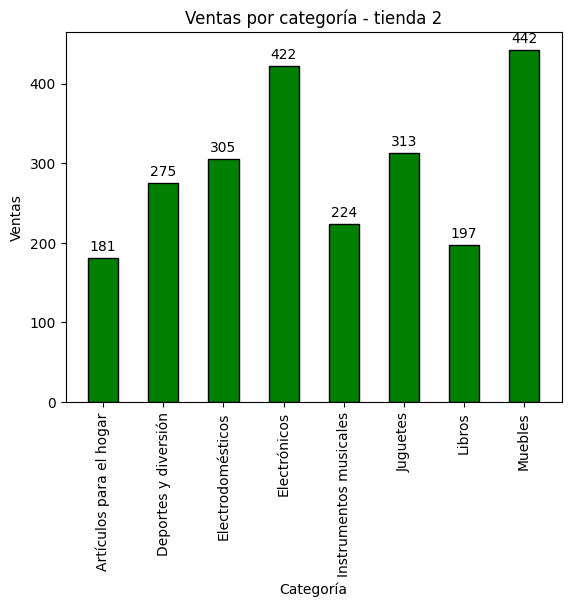

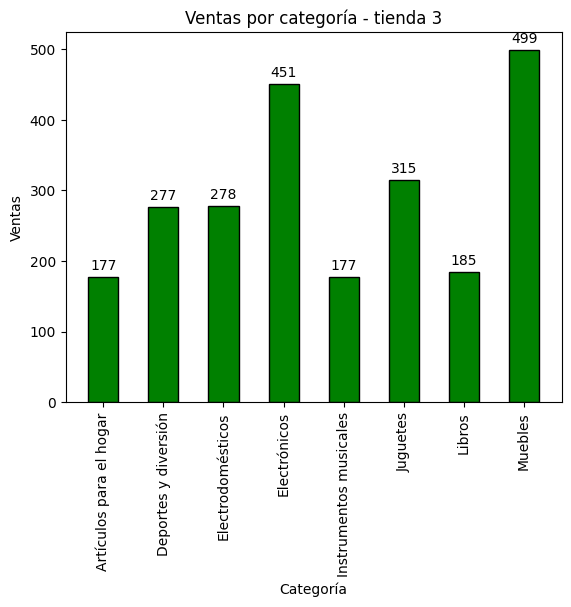

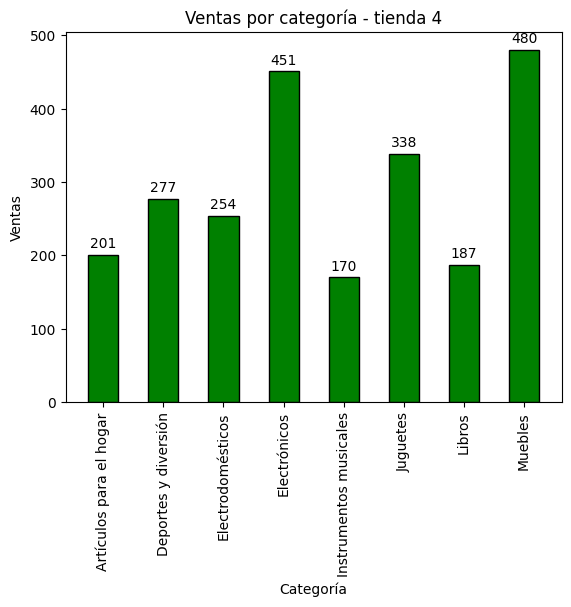

In [5]:
categorias = ["Artículos para el hogar", "Deportes y diversión", "Electrodomésticos", "Electrónicos", "Instrumentos musicales", "Juguetes", "Libros", "Muebles"]

for i in range(len(tiendas)):
  bar = plt.bar(categorias, ventas_categorias[i], color="green", width=0.5, align="center", edgecolor="black")
  plt.xticks(rotation=90)
  plt.bar_label(bar, padding=3)
  plt.title("Ventas por categoría - tienda " + str(i+1))
  plt.xlabel("Categoría")
  plt.ylabel("Ventas")
  plt.show()

# 3. Calificación promedio de la tienda


In [6]:
calificacion_promedio_tiendas = []

for i in range(len(tiendas)):
  calificacion_promedio_tiendas.append(tiendas[i]['Calificación'].mean())

for i in range(len(tiendas)):
  print("\n Calificación promedio de la tienda", i+1, "es", calificacion_promedio_tiendas[i])


 Calificación promedio de la tienda 1 es 3.976685036032217

 Calificación promedio de la tienda 2 es 4.037303942348453

 Calificación promedio de la tienda 3 es 4.048325561678677

 Calificación promedio de la tienda 4 es 3.9957591178965224


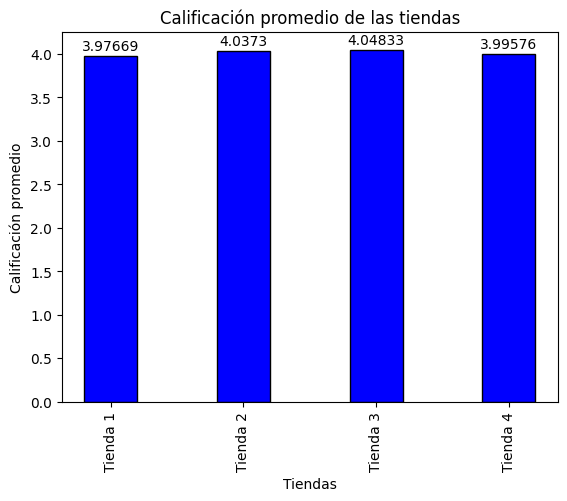

In [7]:
bar = plt.bar(tiendas_labels, calificacion_promedio_tiendas, color="blue", width=0.4, align="center", edgecolor="black")
plt.title("Calificación promedio de las tiendas")
plt.xlabel("Tiendas")
plt.ylabel("Calificación promedio")
plt.xticks(rotation=90)
plt.bar_label(bar, padding=2)
plt.show()

# 4. Productos más y menos vendidos

In [8]:
producto_mas_vendido = []
producto_menos_vendido = []

for t in tiendas:
  conteo = t.groupby('Producto').size() 
  producto_mas_vendido.append(f"{conteo.idxmax()} {conteo.max()}")
  producto_menos_vendido.append(f"{conteo.idxmin()} {conteo.min()}")

for i in range(len(tiendas)):
  print(f"\tTienda {i+1}")
  print(f"\t\tMas Vendido: {producto_mas_vendido[i]}")
  print(f"\t\tMenos Vendido: {producto_menos_vendido[i]}\n")


	Tienda 1
		Mas Vendido: Armario 60
		Menos Vendido: Auriculares con micrófono 33

	Tienda 2
		Mas Vendido: Iniciando en programación 65
		Menos Vendido: Juego de mesa 32

	Tienda 3
		Mas Vendido: Kit de bancas 57
		Menos Vendido: Bloques de construcción 35

	Tienda 4
		Mas Vendido: Cama box 62
		Menos Vendido: Guitarra eléctrica 33



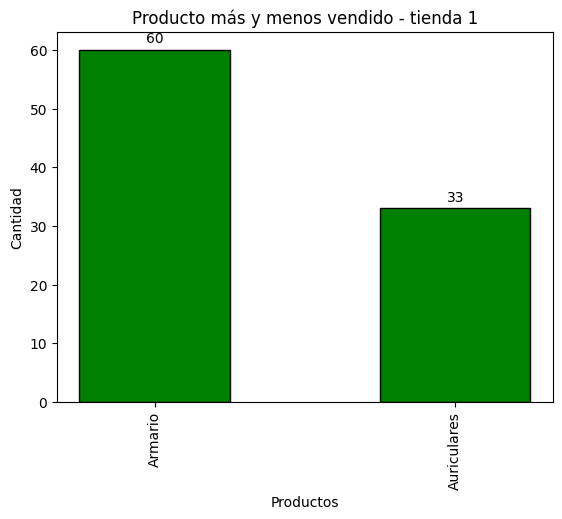

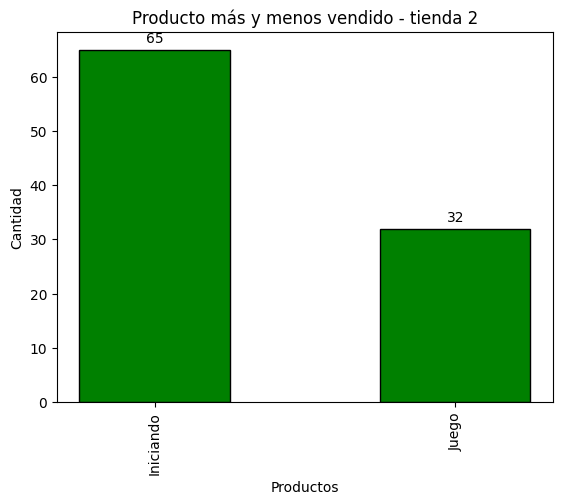

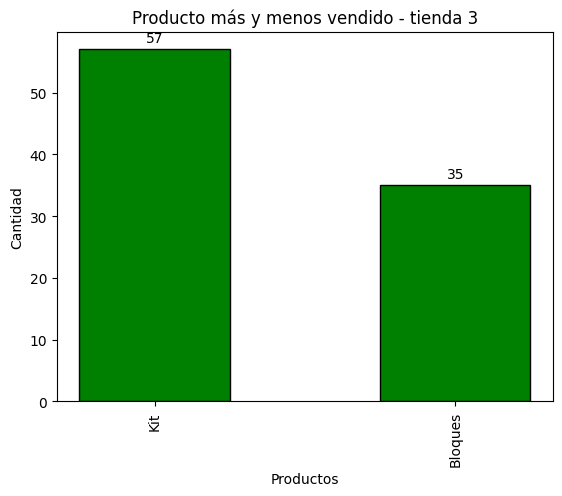

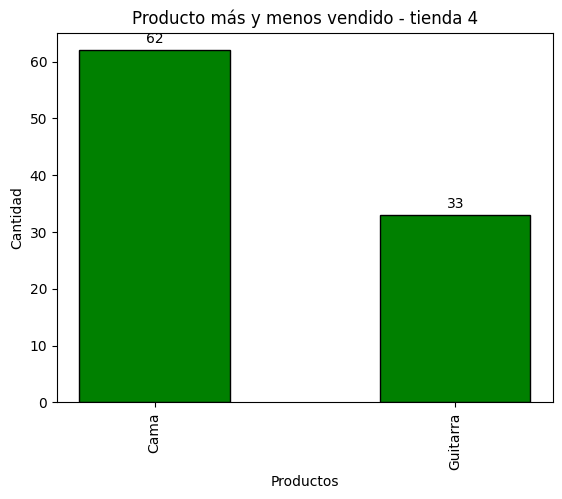

In [9]:
for i in range(len(tiendas)):
  max_min_labels = []
  max_min_values = []
  max_min_values.append(int(producto_mas_vendido[i].split(' ')[-1]))
  max_min_values.append(int(producto_menos_vendido[i].split(' ')[-1]))
  max_min_labels.append(producto_mas_vendido[i].split(' ')[0])
  max_min_labels.append(producto_menos_vendido[i].split(' ')[0])
  bar = plt.bar(max_min_labels, max_min_values , color="green", width=0.5, align="center", edgecolor="black")
  plt.title("Producto más y menos vendido - tienda " + str(i+1))
  plt.xlabel("Productos")
  plt.ylabel("Cantidad")
  plt.xticks(rotation=90)
  plt.bar_label(bar, padding=3)
  plt.show()

# 5. Envío promedio por tienda

In [10]:
costo_promedio_envio_tiendas = []

for i in range(len(tiendas)):
  costo_promedio_envio_tiendas.append(tiendas[i]['Costo de envío'].mean())

for i in range(len(tiendas)):
  print("\n Costo promedio de envío de la tienda", i+1, "es", costo_promedio_envio_tiendas[i])


 Costo promedio de envío de la tienda 1 es 26018.60958033065

 Costo promedio de envío de la tienda 2 es 25216.235693090293

 Costo promedio de envío de la tienda 3 es 24805.680373039424

 Costo promedio de envío de la tienda 4 es 23459.457167090754


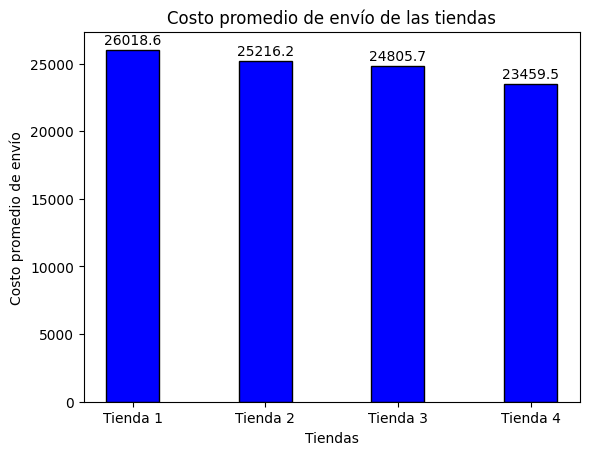

In [11]:
bar = plt.bar(tiendas_labels, costo_promedio_envio_tiendas, color="blue", width=0.4, align="center", edgecolor="black")
plt.title("Costo promedio de envío de las tiendas")
plt.xlabel("Tiendas")
plt.ylabel("Costo promedio de envío")
plt.bar_label(bar, padding=2)
plt.show()

# Informe de Evaluación



Objetivo: Identificar que tienda le conviene vender al Sr. Juan

Factores a evaluar:
  - Suma de ingresos por tienda 
  - Conteo de unidades vendidas por categoría y por producto.
  - Cálculo de calificación promedio de clientes.
  - Media de coste de envío por tienda.

Resultados:
  - Ingresos totales por tienda:
    - Mayor ingresos: Tienda 1 - 1150.88
    - Menor ingresos: Tienda 4 - 1038.38
  - Categorias mas vendidas en las 4 tiendas:
    - Electrónicos
    - Juguetes
    - Muebles
  - Calificación promedio de clientes:
    - Mayor calificación promedio: Tienda 3 - 4.04
    - Menor calificación promedio: Tienda 1 - 3.98
  - Media de coste de envío:
    -  Costo promedio de envío de la tienda 1 es 26018.61
    - Costo promedio de envío de la tienda 4 es 23459.46

Conclusión:
  Teniendo en cuenta que el objetivo es incorporar un nuevo emprendimiento, es mejor mantener sus finanzas solidas y vender la tienda 4, ya que es la que menos ingresos tiene y no destaca en ninguna categoría, si bien es la que menos gasta en promedio de envio, esto puede ser proporcional a que no es la que mas vende, por lo que no es un factor determinante.


In [ ]:
df_total = pd.concat([tienda, tienda2, tienda3, tienda4])
lat_center = df_total['lat'].mean()
lon_center = df_total['lon'].mean()

m = folium.Map(location=[lat_center, lon_center], zoom_start=6)

colores = ['blue', 'red', 'green', 'purple']
dfs = [tienda, tienda2, tienda3, tienda4]
nombres = ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4']

for df, color, nombre in zip(dfs, colores, nombres):
    for _, row in df.iterrows():
        folium.CircleMarker(
            location=[row['lat'], row['lon']],
            radius=5,
            popup=f"{nombre}<br>Producto: {row['Producto']}<br>Precio: {row['Precio']}<br>Calificación: {row['Calificación']}",
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.6
        ).add_to(m)

m
